In [1]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, f1_score
import numpy
import lightgbm
from xgboost import XGBClassifier
from sklearn.metrics import balanced_accuracy_score


In [2]:
dfN = pd.read_parquet('../feature-extraction/floor/umbrella_benign_FINISHED_HTML.parquet')
filtered_Um1 = dfN.filter(like='html', axis=1)
print(filtered_Um1.isnull().any().any())

filtered_Um1

False


,html_num_of_tags,html_num_of_paragraphs,html_num_of_divs,html_num_of_titles,html_num_of_external_js,html_num_of_links,html_num_of_scripts,html_num_of_scripts_async,html_num_of_scripts_type,html_num_of_anchors,...,html_index_of,html_document_write,html_get,html_find,html_document_create_element,html_window_set_timeout,html_window_set_interval,html_hex_encoding,html_unicode_encoding,html_long_variable_name
0,34,7,245,1,25,21,42,1,7,112,...,0,0,3,0,0,0,0,0,26,521
1,15,5,6,1,0,0,2,0,0,2,...,0,0,0,0,2,0,0,0,0,4
2,8,1,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,...,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1
4,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,...,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
368951,14,0,60,1,5,35,33,1,7,0,...,17,0,2,0,7,0,0,0,729,73
368952,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,...,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1
368953,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,...,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1
368954,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,...,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1


In [3]:
dfN = pd.read_parquet('../feature-extraction/floor/benign_2312_HTML.parquet')
filtered_B1 = dfN.filter(like='html', axis=1)
print(filtered_B1.isnull().any().any())

filtered_B1

False


,html_num_of_tags,html_num_of_paragraphs,html_num_of_divs,html_num_of_titles,html_num_of_external_js,html_num_of_links,html_num_of_scripts,html_num_of_scripts_async,html_num_of_scripts_type,html_num_of_anchors,...,html_index_of,html_document_write,html_get,html_find,html_document_create_element,html_window_set_timeout,html_window_set_interval,html_hex_encoding,html_unicode_encoding,html_long_variable_name
0,31,14,83,1,62,32,64,0,64,85,...,0,0,0,0,0,0,0,0,0,9
1,18,2,4,1,0,0,2,0,0,3,...,0,0,0,0,0,0,0,0,0,4
2,8,0,7,1,4,1,4,0,4,0,...,0,0,0,0,0,0,0,0,0,0
3,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,...,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1
4,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,...,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
462187,1,0,0,0,0,0,1,0,1,0,...,0,0,0,0,0,0,0,0,0,0
462188,8,0,1,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
462189,24,4,37,1,18,28,26,1,26,2,...,3,0,0,0,1,0,0,0,73,11
462190,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,...,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1


In [4]:
concatenated_Both = pd.concat([filtered_Um1, filtered_B1], ignore_index=True)
concatenated_Both

,html_num_of_tags,html_num_of_paragraphs,html_num_of_divs,html_num_of_titles,html_num_of_external_js,html_num_of_links,html_num_of_scripts,html_num_of_scripts_async,html_num_of_scripts_type,html_num_of_anchors,...,html_index_of,html_document_write,html_get,html_find,html_document_create_element,html_window_set_timeout,html_window_set_interval,html_hex_encoding,html_unicode_encoding,html_long_variable_name
0,34,7,245,1,25,21,42,1,7,112,...,0,0,3,0,0,0,0,0,26,521
1,15,5,6,1,0,0,2,0,0,2,...,0,0,0,0,2,0,0,0,0,4
2,8,1,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,...,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1
4,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,...,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
831143,1,0,0,0,0,0,1,0,1,0,...,0,0,0,0,0,0,0,0,0,0
831144,8,0,1,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
831145,24,4,37,1,18,28,26,1,26,2,...,3,0,0,0,1,0,0,0,73,11
831146,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,...,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1


In [5]:
concatenated_Both = concatenated_Both.loc[~(concatenated_Both == -1).all(axis=1)]

# Print the updated DataFrame

concatenated_Both['label'] = 'benign'
concatenated_Both

/tmp/ipykernel_15906/231085005.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  concatenated_Both['label'] = 'benign'


,html_num_of_tags,html_num_of_paragraphs,html_num_of_divs,html_num_of_titles,html_num_of_external_js,html_num_of_links,html_num_of_scripts,html_num_of_scripts_async,html_num_of_scripts_type,html_num_of_anchors,...,html_document_write,html_get,html_find,html_document_create_element,html_window_set_timeout,html_window_set_interval,html_hex_encoding,html_unicode_encoding,html_long_variable_name,label
0,34,7,245,1,25,21,42,1,7,112,...,0,3,0,0,0,0,0,26,521,benign
1,15,5,6,1,0,0,2,0,0,2,...,0,0,0,2,0,0,0,0,4,benign
2,8,1,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,benign
6,4,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,benign
7,40,16,189,9,7,7,13,0,6,159,...,0,0,0,0,0,0,0,0,11,benign
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
831141,11,0,3,1,5,15,6,0,6,1,...,0,0,0,0,0,0,0,0,0,benign
831143,1,0,0,0,0,0,1,0,1,0,...,0,0,0,0,0,0,0,0,0,benign
831144,8,0,1,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,benign
831145,24,4,37,1,18,28,26,1,26,2,...,0,0,0,1,0,0,0,73,11,benign


In [6]:
concatenated_Both_reduced = concatenated_Both.sample(n=250222, random_state=42)
concatenated_Both_reduced

,html_num_of_tags,html_num_of_paragraphs,html_num_of_divs,html_num_of_titles,html_num_of_external_js,html_num_of_links,html_num_of_scripts,html_num_of_scripts_async,html_num_of_scripts_type,html_num_of_anchors,...,html_document_write,html_get,html_find,html_document_create_element,html_window_set_timeout,html_window_set_interval,html_hex_encoding,html_unicode_encoding,html_long_variable_name,label
567311,27,2,327,1,10,37,13,2,2,141,...,0,0,0,0,0,0,0,1,4,benign
293181,16,0,1,0,1,11,2,0,1,3,...,0,0,0,0,0,0,0,0,0,benign
141842,34,74,493,1,43,19,140,16,63,470,...,0,4,3,12,0,0,0,335,677,benign
628588,15,4,40,0,7,14,11,6,1,31,...,0,0,0,0,0,0,0,0,19,benign
752167,17,1,10,1,3,5,4,0,0,0,...,0,0,0,0,0,0,0,0,0,benign
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
708421,38,54,623,1,30,45,50,2,37,77,...,0,0,0,0,0,0,0,73,18,benign
201818,37,23,161,1,3,17,6,0,5,98,...,0,0,0,0,0,0,0,0,2,benign
821781,28,9,79,1,8,16,12,1,4,57,...,0,0,0,0,0,0,0,54,6,benign
49283,35,3,392,1,5,40,15,1,6,167,...,0,0,0,1,0,0,0,0,9,benign


In [7]:

dfP = pd.read_parquet('../feature-extraction/floor/phishing_2406_strict_HTML.parquet')
filtered_dfP = dfP.filter(like='html', axis=1)

filtered_dfP_excluded = filtered_dfP.loc[~(filtered_dfP == -1).all(axis=1)]

filtered_dfP_excluded['label'] = 'phishing'
filtered_dfP_excluded

/tmp/ipykernel_15906/1978467373.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_dfP_excluded['label'] = 'phishing'


,html_num_of_tags,html_num_of_paragraphs,html_num_of_divs,html_num_of_titles,html_num_of_external_js,html_num_of_links,html_num_of_scripts,html_num_of_scripts_async,html_num_of_scripts_type,html_num_of_anchors,...,html_document_write,html_get,html_find,html_document_create_element,html_window_set_timeout,html_window_set_interval,html_hex_encoding,html_unicode_encoding,html_long_variable_name,label
16,26,1,44,1,4,6,8,2,4,7,...,0,7,0,0,0,0,90,21,22,phishing
32,26,1,44,1,4,6,8,2,4,7,...,0,7,0,0,0,0,90,21,22,phishing
35,26,1,44,1,4,6,8,2,4,7,...,0,7,0,0,0,0,90,318,22,phishing
41,9,0,4,1,1,58,1,0,1,0,...,0,0,0,0,0,0,0,0,0,phishing
42,26,1,44,1,4,6,8,2,4,7,...,0,7,0,0,0,0,90,21,22,phishing
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
164387,10,2,4,2,0,0,2,0,0,0,...,0,0,0,0,0,0,0,0,0,phishing
164391,6,1,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,phishing
164401,19,3,8,1,0,1,3,0,0,2,...,0,0,0,0,0,0,0,0,0,phishing
164405,24,1,192,1,7,3,7,0,0,29,...,0,0,0,0,0,0,0,0,0,phishing


In [8]:
concatenated_Both_reduced.dropna(inplace=True)
filtered_dfP_excluded.dropna(inplace=True)
combined_df = pd.concat([concatenated_Both_reduced, filtered_dfP_excluded], axis=0)
combined_df

/tmp/ipykernel_15906/922603387.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_dfP_excluded.dropna(inplace=True)


,html_num_of_tags,html_num_of_paragraphs,html_num_of_divs,html_num_of_titles,html_num_of_external_js,html_num_of_links,html_num_of_scripts,html_num_of_scripts_async,html_num_of_scripts_type,html_num_of_anchors,...,html_document_write,html_get,html_find,html_document_create_element,html_window_set_timeout,html_window_set_interval,html_hex_encoding,html_unicode_encoding,html_long_variable_name,label
567311,27,2,327,1,10,37,13,2,2,141,...,0,0,0,0,0,0,0,1,4,benign
293181,16,0,1,0,1,11,2,0,1,3,...,0,0,0,0,0,0,0,0,0,benign
141842,34,74,493,1,43,19,140,16,63,470,...,0,4,3,12,0,0,0,335,677,benign
628588,15,4,40,0,7,14,11,6,1,31,...,0,0,0,0,0,0,0,0,19,benign
752167,17,1,10,1,3,5,4,0,0,0,...,0,0,0,0,0,0,0,0,0,benign
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
164387,10,2,4,2,0,0,2,0,0,0,...,0,0,0,0,0,0,0,0,0,phishing
164391,6,1,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,phishing
164401,19,3,8,1,0,1,3,0,0,2,...,0,0,0,0,0,0,0,0,0,phishing
164405,24,1,192,1,7,3,7,0,0,29,...,0,0,0,0,0,0,0,0,0,phishing


In [9]:
bool_cols = combined_df.select_dtypes(include='bool').columns
print(bool_cols)
combined_df[bool_cols] = combined_df[bool_cols].astype(int)
pdaFeatures = combined_df.loc[:, combined_df.columns != "label"] # get features
pdaLabel = pd.DataFrame() 
pdaLabel["label"] = combined_df["label"] # get labels
print(len(pdaFeatures))

Index([], dtype='object')
274811


In [10]:
dX_train, X_test, y_train, y_test = train_test_split(pdaFeatures, pdaLabel, test_size=0.20, random_state=42) # split data into training and testing data
ratio = (y_train["label"] == "benign").sum() / (y_train["label"] == "phishing").sum()
ratio

10.177385733895978

In [11]:
## Model Validation Functions

In [12]:
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from sklearn.metrics import roc_curve, auc, accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report, log_loss, ConfusionMatrixDisplay
import matplotlib.pyplot as plt
from kneed import KneeLocator

# Helpers
from kneed import KneeLocator

def plot_metric(metric):
    plt.rcParams["figure.dpi"] = 300
    
    # Plot metric curves
    plt.plot(x_axis, results['valid_0'][metric], label='Training set')
    plt.plot(x_axis, results['valid_1'][metric], label='Testing set')
    
    # Detect elbow using Kneedle algorithm
    kn = KneeLocator(x_axis, results['valid_1'][metric], curve='convex', direction='decreasing')
    if kn.knee:
        plt.vlines(kn.knee, plt.ylim()[0], plt.ylim()[1], linestyles='dashed', colors='red', label='Elbow at tree ' + str(kn.knee))
    
    plt.legend()
    mnames = {'error': 'Classification Error', 'binary_logloss': 'Log Loss', 'auc': 'AUC'}
    mname = mnames.get(metric, metric)  # Return the metric itself if it's not in the dictionary
    plt.ylabel(mname)
    plt.xlabel('Number of trees')
    plt.title('LightGBM ' + mname)
    plt.show()

    
# Tuning - graphs
def DisplayTuningGraph(scores):
    from numpy import array
    from numpy.ma import masked_array

    col_names = ['mean_train_score', 'mean_test_score']
    means_df = scores[col_names]
    ax = means_df.plot(kind='line', grid=True)

    from matplotlib import pyplot as plt
    plt.rcParams["figure.figsize"] = [12, 12]
    plt.rcParams["figure.autolayout"] = True

    plt.rcParams["figure.dpi"] = 300

    max_ids = means_df.idxmax(axis=0)

    for i in range(len(max_ids)):
        for col_name in col_names:
            value = means_df[col_name][max_ids[i]]
            id = max_ids[i]

            color = 'r' if max_ids[i] == max_ids['mean_test_score'] else 'grey'

            ax.scatter([id], [value],
                      marker='o',
                      color=color,
                      label='point',)

            ax.annotate(str(round(value, 3))+"_ID="+str(id),
                        (id, value),
                        xytext=(id+3, value))
    print(scores)

def ValidateModel_advanced(X_test, y_test, model): 
    y_pred = model.predict(X_test)
    
    # Classification report
    print(classification_report(y_test, y_pred, digits=4))

    # Confusion Matrix
    cm = confusion_matrix(y_test, y_pred, labels=model.classes_)
    tn, fp, fn, tp = cm.ravel()
    print("Confusion Matrix:")
    print("TN:", tn, "FP:", fp, "FN:", fn, "TP:", tp)

    # Plotting ROC Curve
    y_prob = model.predict_proba(X_test)[:, 1] if hasattr(model, "predict_proba") else model.decision_function(X_test)
    fpr, tpr, _ = roc_curve(y_test, y_prob, pos_label="phishing")
    roc_auc = auc(fpr, tpr)
    plt.figure()
    plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve')
    plt.legend(loc="lower right")
    plt.show()

    # Model-specific evaluations
    if isinstance(model, (XGBClassifier, LGBMClassifier)):
        
        if isinstance(model, (XGBClassifier)):
            results = model.evals_result()
        elif isinstance(model, (LGBMClassifier)):
            results = model.evals_result_

        training_key = 'valid_0' if isinstance(model, LGBMClassifier) else 'validation_0'
        validation_key = 'valid_1' if isinstance(model, LGBMClassifier) else 'validation_1'
        
        print("Training metrics:", results[training_key].keys())
        print("Validation metrics:", results[validation_key].keys())

        trees = len(results[validation_key]['binary_logloss']) if isinstance(model, LGBMClassifier) else len(results[validation_key]['logloss'])
        x_axis = range(0, trees)

        def plot_metric(metric):
            plt.rcParams["figure.dpi"] = 300

            # Plot metric curves
            plt.plot(x_axis, results[training_key][metric], label='Training set')
            plt.plot(x_axis, results[validation_key][metric], label='Validation set')

            # Detect elbow using Kneedle algorithm
            kn = KneeLocator(x_axis, results[validation_key][metric], curve='convex', direction='decreasing')
            if kn.knee:
                plt.vlines(kn.knee, plt.ylim()[0], plt.ylim()[1], linestyles='dashed', colors='red', label='Elbow at tree ' + str(kn.knee))

            plt.legend()
            mnames = {'binary_logloss': 'Log Loss', 'auc': 'AUC'}
            mname = mnames.get(metric, metric)
            plt.ylabel(mname)
            plt.xlabel('Number of trees')
            plt.title(f'{type(model).__name__} {mname}')
            plt.show()

        if isinstance(model, LGBMClassifier):
            plot_metric('binary_logloss')
        elif isinstance(model, XGBClassifier):
            plot_metric('logloss')
            
        plot_metric('auc')
        
    elif isinstance(model, (RandomForestClassifier, AdaBoostClassifier)):
        # For RandomForest and AdaBoost, additional model-specific evaluations can be added here
        pass
    
    # Display the confusion matrix
    cm = confusion_matrix(y_test, y_pred, labels=model.classes_)  # Compute confusion matrix
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=model.classes_)  # Create display object
    disp.plot(cmap=plt.cm.Blues)  # Plot confusion matrix
    plt.show()  # Show the plot

In [13]:
## Training

In [14]:
lightGBMClas = lightgbm.LGBMClassifier(
    objective="binary",
    scale_pos_weight =1.5,
    learning_rate=0.06602369501275443,
    n_estimators=370,
    lambda_l2=1.6490348893997209,
    lambda_l1 = 2.4914406958019306,
    min_data_in_leaf = 33,
    num_leaves = 38,
    max_depth = 11,
    bagging_fraction = 0.8681477041641465,
    bagging_freq = 3,
    colsample_bytree = 0.690339625082658,
    min_split_gain = 0.4543145807064982,
    max_bin = 357,
    metric=['error', 'binary_logloss', 'auc'],
    seed = 500,
    verbosity = -1,
    boosting_type = 'gbdt',
    
    
)  # set hyperparameters


npLabel: numpy.ndarray = y_train.to_numpy() 
eval_set = [(dX_train, npLabel.ravel()), (X_test, y_test)]
lightGBMClas.fit(dX_train, npLabel.ravel(), eval_set=eval_set) # fit model
prediction = lightGBMClas.predict(X_test)
print("F1 score: ", f1_score(y_test, prediction,pos_label='phishing'))
print("Accuracy: ", accuracy_score(y_test, prediction))
print("Balanced accuracy: ", balanced_accuracy_score(y_test, prediction))

/home/polonip/praca/posledna/domainradar-training/.venv/lib/python3.11/site-packages/sklearn/preprocessing/_label.py:132: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


F1 score:  0.7698122121176332
Accuracy:  0.964539781307425
Balanced accuracy:  0.8283216616636522


              precision    recall  f1-score   support

      benign     0.9677    0.9942    0.9808     50043
    phishing     0.9188    0.6624    0.7698      4920

    accuracy                         0.9645     54963
   macro avg     0.9432    0.8283    0.8753     54963
weighted avg     0.9633    0.9645    0.9619     54963

Confusion Matrix:
TN: 49755 FP: 288 FN: 1661 TP: 3259


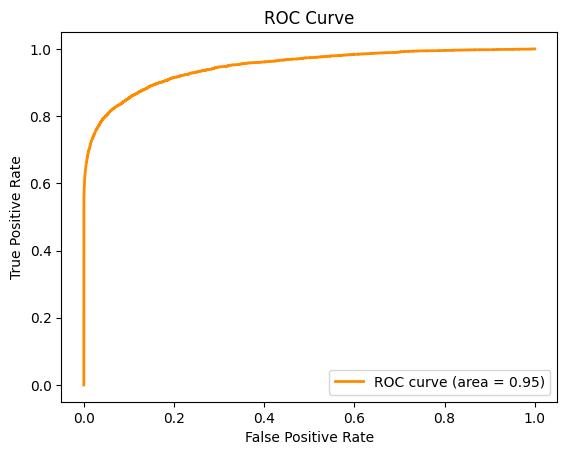

Training metrics: odict_keys(['binary_logloss', 'auc'])
Validation metrics: odict_keys(['binary_logloss', 'auc'])


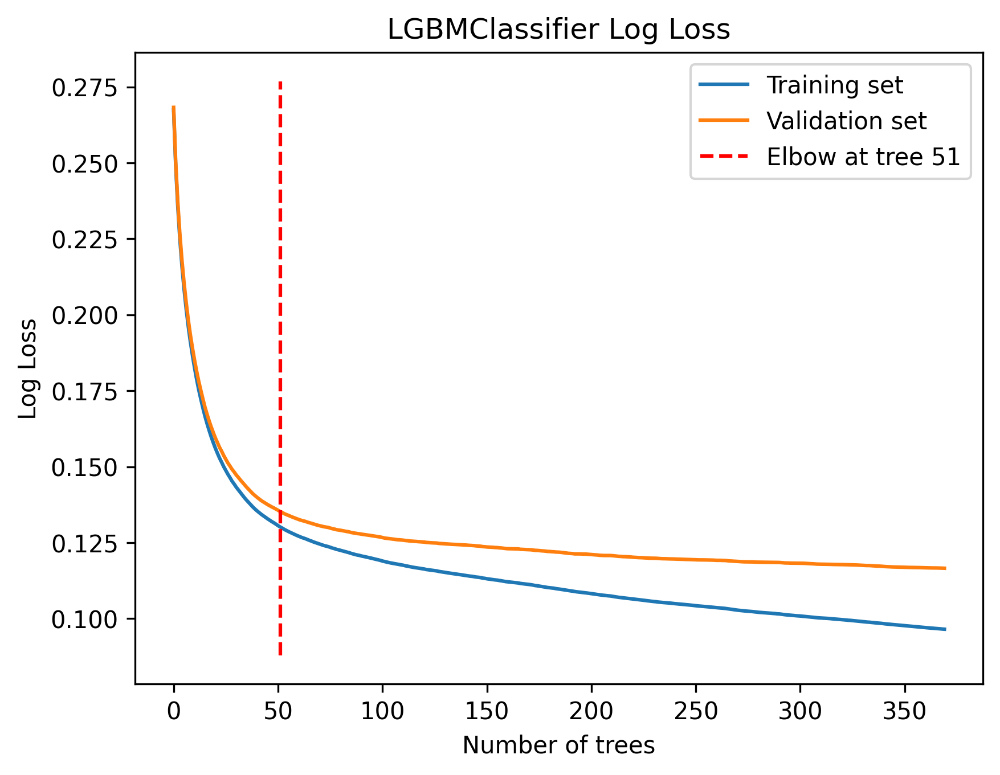

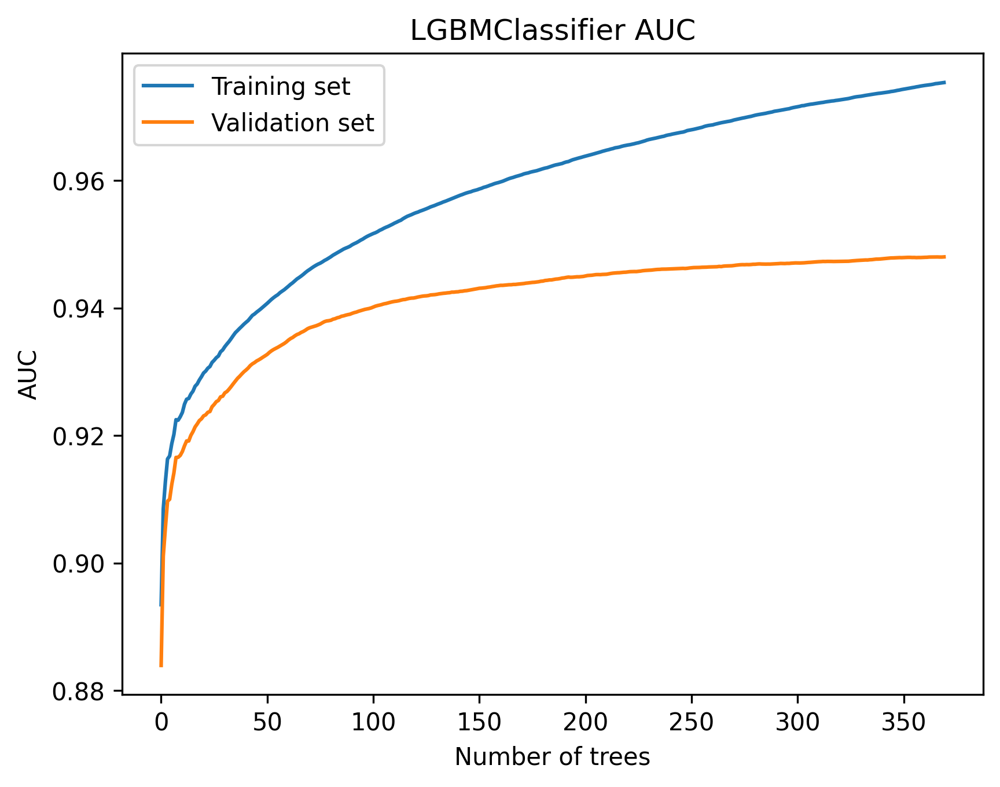

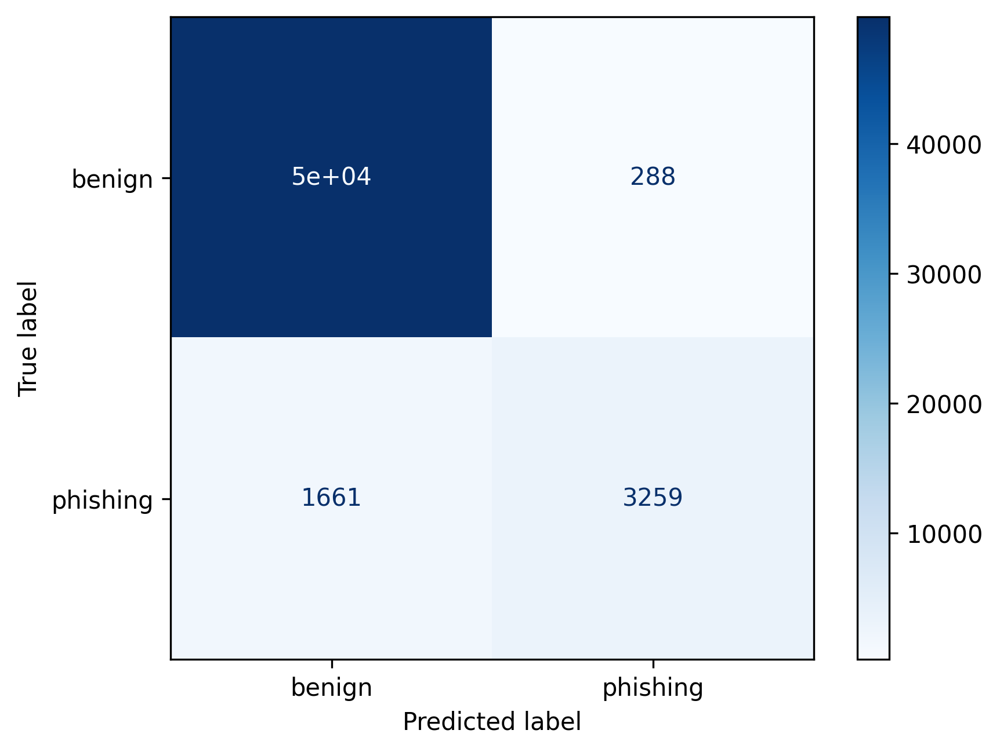

In [15]:
ValidateModel_advanced(X_test, y_test, lightGBMClas)

In [16]:
## Test on another validation dataset

In [17]:
valB = pd.read_parquet('/home/polonip/praca/domainradar-training/testdata/2405_clftest_benign_filtered_HTML.parquet')
valP = pd.read_parquet('/home/polonip/praca/domainradar-training/testdata/2405_clftest_phishing_filtered_HTML.parquet')

In [18]:
filtered_valB = valB.filter(like='html', axis=1)
filtered_valB['domain_name'] = valB['domain_name']
filtered_valB['label'] = 'benign'  # Add label column
filtered_valP = valP.filter(like='html', axis=1)
filtered_valP['domain_name'] = valP['domain_name']
filtered_valP['label'] = 'phishing'

combined_dfV = pd.concat([filtered_valB, filtered_valP], axis=0)
print(combined_dfV.head())

   html_create_element  html_write  html_char_code_at  html_concat  \
0                  2.0         0.0                0.0          0.0   
1                  0.0         0.0                0.0          0.0   
2                  0.0         0.0                0.0          0.0   
3                  0.0         0.0                0.0          0.0   
4                  2.0         0.0                0.0          0.0   

   html_escape  html_eval  html_exec  html_from_char_code  html_link  \
0          0.0        0.0        0.0                  0.0        0.0   
1          0.0        0.0        0.0                  0.0        0.0   
2          1.0        0.0        0.0                  0.0        0.0   
3          0.0        0.0        0.0                  0.0        0.0   
4          0.0        0.0        0.0                  0.0        0.0   

   html_parse_int  ...  html_malicious_form  html_most_common  \
0             0.0  ...                  1.0          0.063830   
1             0.

/tmp/ipykernel_15906/788138558.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_valB['domain_name'] = valB['domain_name']
/tmp/ipykernel_15906/788138558.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_valB['label'] = 'benign'  # Add label column
/tmp/ipykernel_15906/788138558.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.py

In [19]:
labels_df = combined_dfV[['label']].copy()
combined_dfV = combined_dfV.drop(columns=['label'])
combined_dfV = combined_dfV.drop(columns=['html_entropy'])

In [20]:
print(labels_df)

        label
0      benign
1      benign
2      benign
3      benign
4      benign
..        ...
161  phishing
162  phishing
163  phishing
164  phishing
165  phishing

[882 rows x 1 columns]


0      0
1      0
2      0
3      0
4      0
      ..
877    1
878    1
879    1
880    1
881    1
Name: label, Length: 882, dtype: int64 0      0
1      1
2      0
3      0
4      0
      ..
877    0
878    1
879    1
880    0
881    1
Length: 882, dtype: int64
Accuracy: 0.808390022675737
Weighted Accuracy: 0.6390422023288685
Precision: 0.488
Recall: 0.3674698795180723
F1 Score: 0.41924398625429554
False Positive Rate: 0.0893854748603352


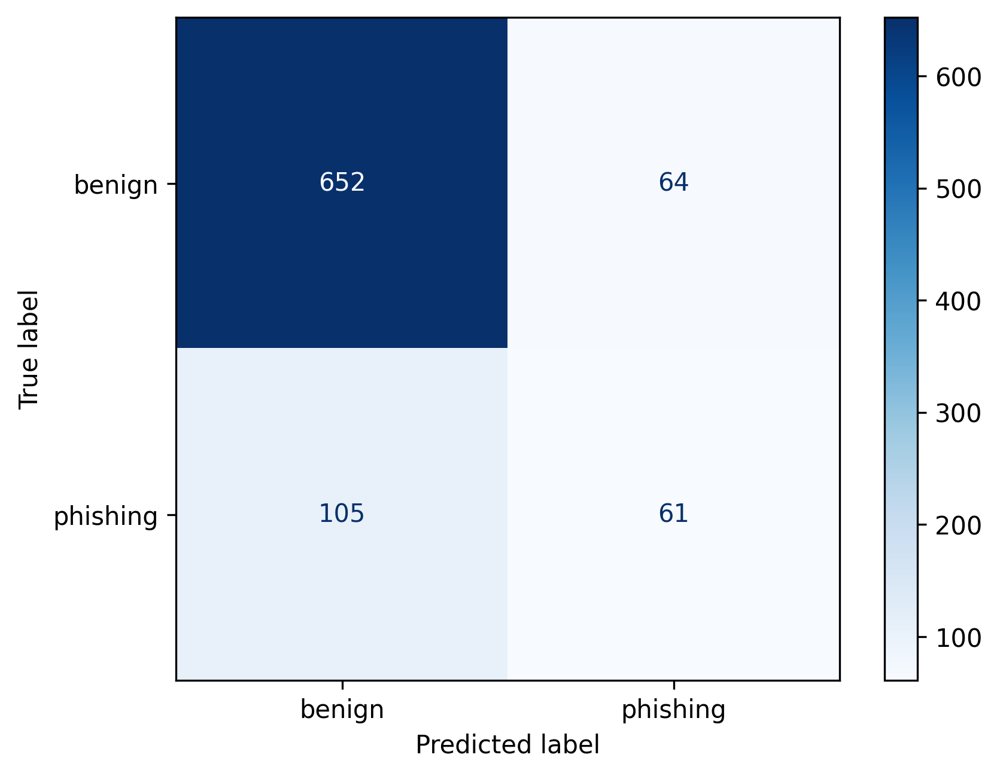

     html_create_element  html_write  html_char_code_at  html_concat  \
1                    0.0         0.0                0.0          0.0   
6                    1.0         1.0                0.0          0.0   
25                  13.0         0.0                0.0          1.0   
46                   2.0         0.0                0.0          0.0   
52                   0.0         0.0                0.0          0.0   
..                   ...         ...                ...          ...   
118                  0.0         0.0                0.0          0.0   
147                  7.0         2.0                0.0          0.0   
151                 10.0         0.0                0.0          0.0   
152                  0.0         0.0                0.0          0.0   
160                  0.0         0.0                0.0          0.0   

     html_escape  html_eval  html_exec  html_from_char_code  html_link  \
1            0.0        0.0        0.0                  0.0  

/tmp/ipykernel_15906/2928687492.py:37: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  misclassified = df_validation[y_val != y_pred]


In [21]:
df_validation = combined_dfV.copy()
df_validation['label'] = labels_df['label']
combined_dfV = combined_dfV.drop(columns=['domain_name'])
y_pred = lightGBMClas.predict(combined_dfV)
y_pred = pd.Series(y_pred).map({'benign': 0, 'phishing': 1})
y_val = labels_df['label'].map({'benign': 0, 'phishing': 1})
y_pred = y_pred.reset_index(drop=True)
y_val = y_val.reset_index(drop=True)
print(y_val, y_pred)

df_validation['y_val'] = y_val
df_validation['y_pred'] = y_pred

if y_pred.isnull().any():
    print("There are unmapped values in y_pred. Exiting...")
else:
    accuracy = accuracy_score(y_val, y_pred)
    weighted_accuracy = (accuracy_score(y_val[y_val == 0], y_pred[y_val == 0]) + accuracy_score(y_val[y_val == 1], y_pred[y_val == 1])) / 2
    precision = precision_score(y_val, y_pred)
    recall = recall_score(y_val, y_pred)
    f1 = f1_score(y_val, y_pred)
    tn, fp, fn, tp = confusion_matrix(y_val, y_pred).ravel()
    false_positive_rate = fp / (fp + tn)

    print(f'Accuracy: {accuracy}')
    print(f'Weighted Accuracy: {weighted_accuracy}')
    print(f'Precision: {precision}')
    print(f'Recall: {recall}')
    print(f'F1 Score: {f1}')
    print(f'False Positive Rate: {false_positive_rate}')

    cm = confusion_matrix(y_val, y_pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['benign', 'phishing'])
    disp.plot(cmap=plt.cm.Blues)
    plt.show()

    misclassified = df_validation[y_val != y_pred]
    print(misclassified)
    misclassified_domains = misclassified['domain_name'].tolist()
    print(f'Misclassified domains: {misclassified_domains}')


Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)

A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


     html_create_element  html_write  html_char_code_at  html_concat  \
1                    0.0         0.0                0.0          0.0   
6                    1.0         1.0                0.0          0.0   
25                  13.0         0.0                0.0          1.0   
46                   2.0         0.0                0.0          0.0   
52                   0.0         0.0                0.0          0.0   
58                   7.0         0.0                0.0          0.0   
73                   4.0         0.0                2.0          1.0   
95                   0.0         0.0                0.0          0.0   
103                  3.0         0.0                0.0          0.0   
115                  2.0         0.0                0.0          0.0   
118                  3.0         0.0                0.0          0.0   
147                  6.0         0.0                0.0          0.0   
151                  1.0         0.0                0.0         

LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray


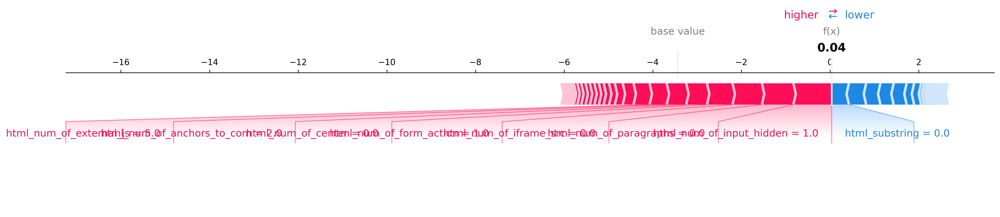

Domain: www.fisherman.cz


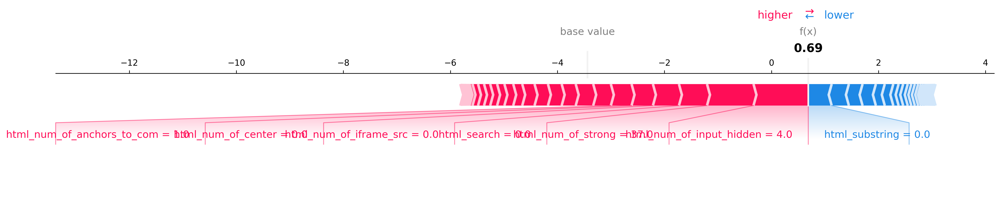

Domain: zuty.cz


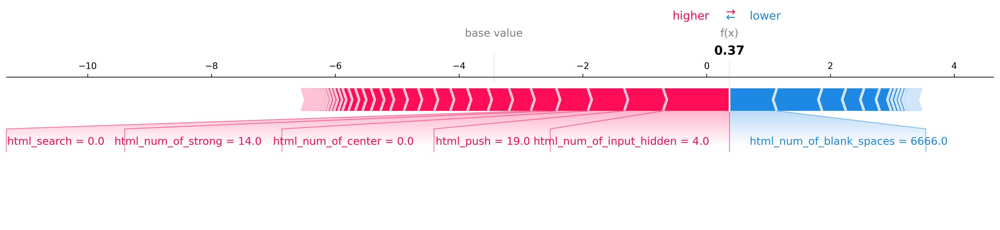

Domain: www.fcrccvt.com


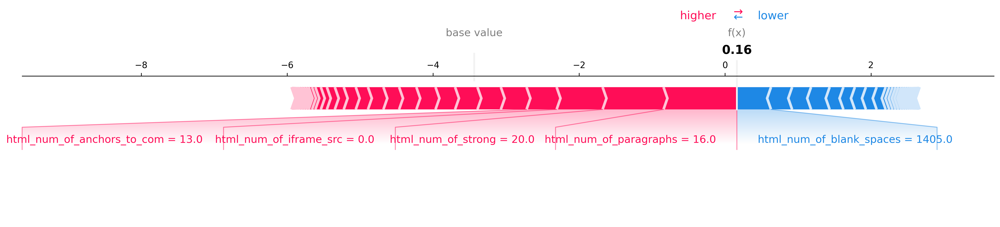

Domain: imageshimage.com


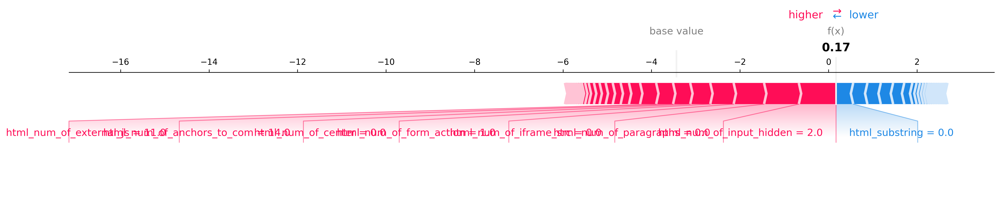

Domain: bydlimeutulne.cz


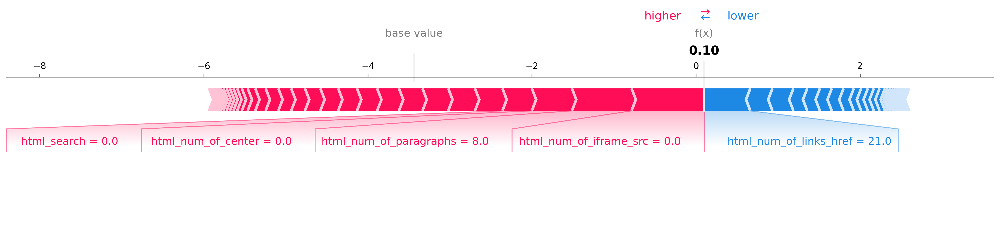

Domain: moneyerp.com


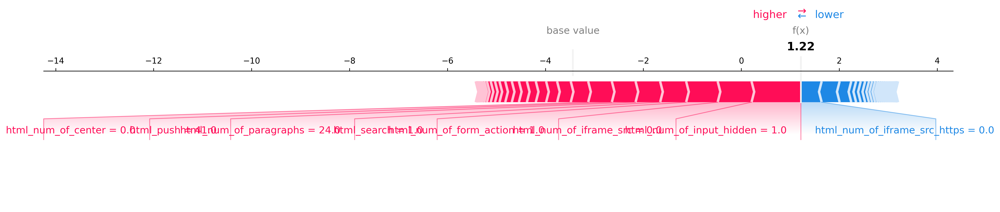

Domain: xmmxer4.cfd


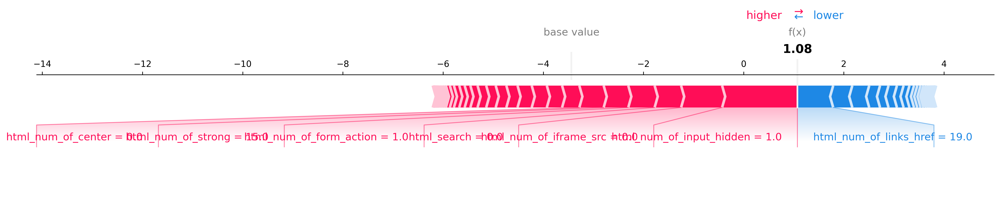

Domain: www.tisvapo.it


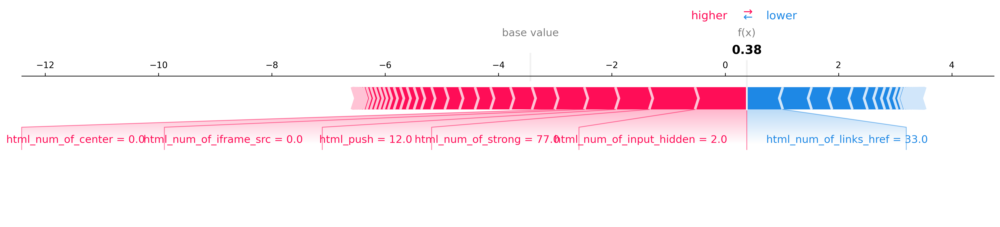

Domain: distinctionloadedadjourn.com


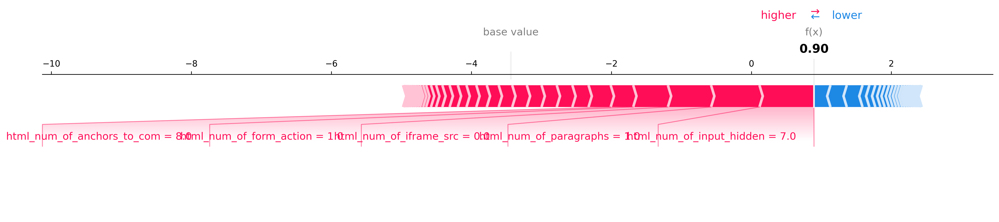

Domain: www.nedelejsivrasky.cz


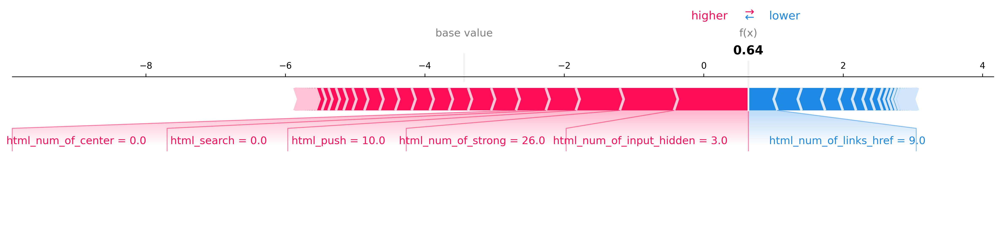

Domain: rejstriky.finance.cz


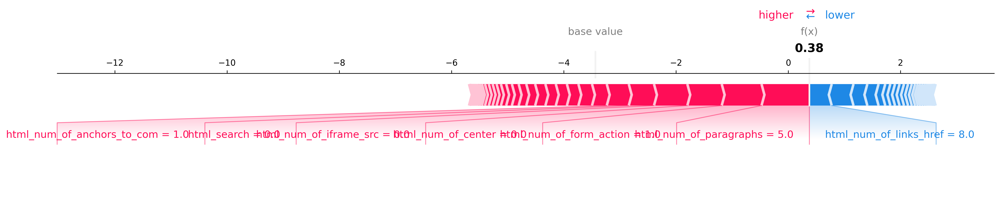

Domain: www.cbvk.cz


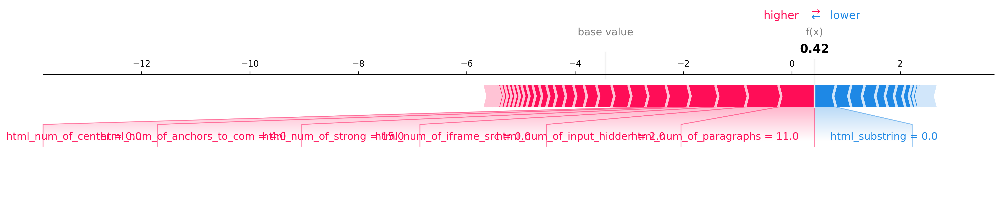

Domain: www.xushuge.com


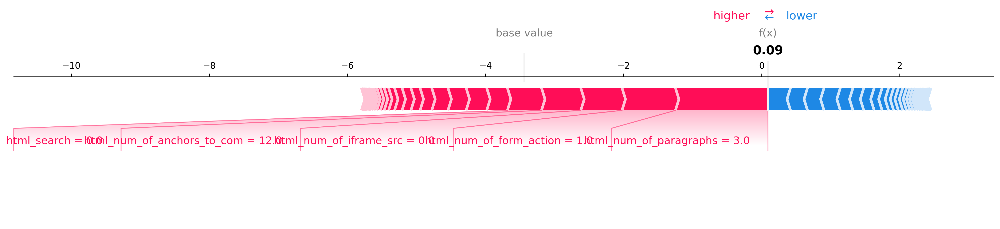

Domain: www.ouskripov.eu


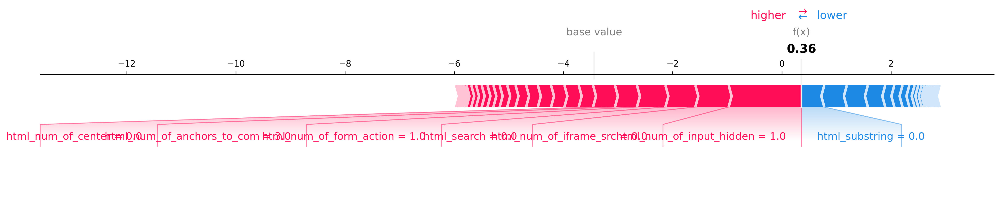

Domain: www.freepatentsonline.com


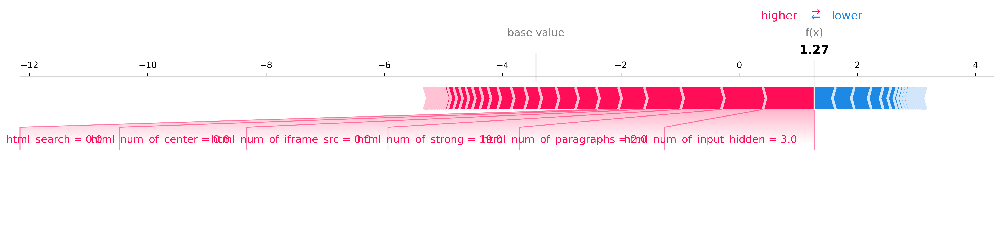

Domain: freebookmarkstore.win


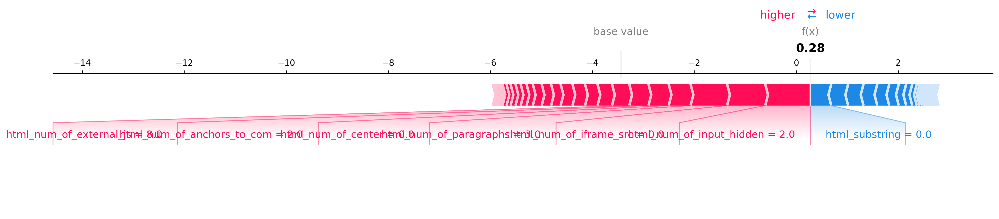

Domain: zkouskaosobnosti.cz


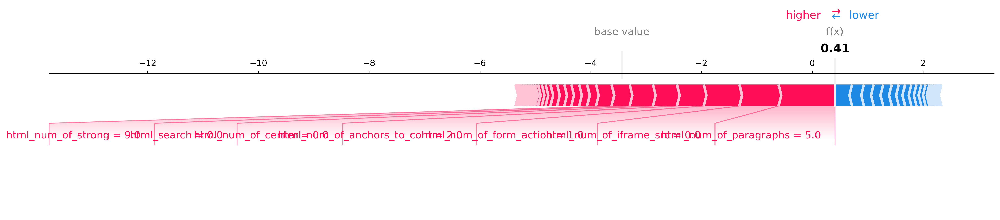

Domain: sentry.eobuwie.org


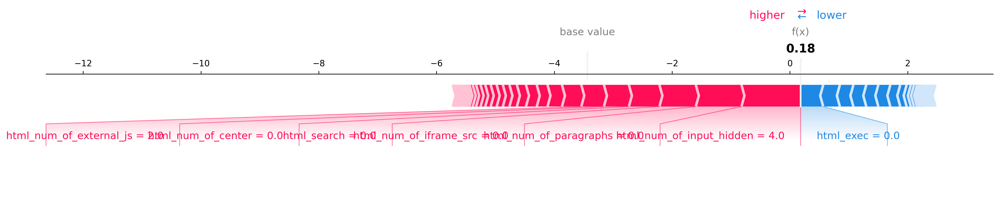

Domain: www.dunshuge.com


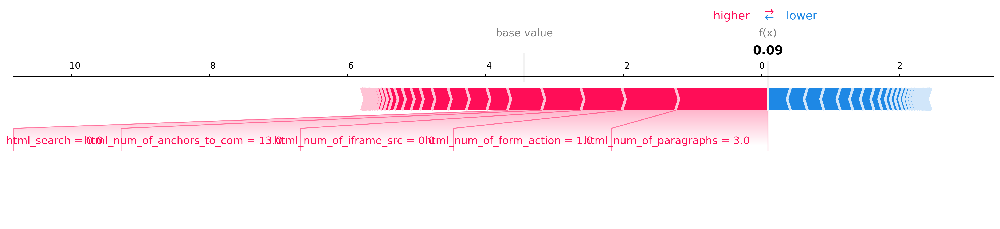

In [22]:
import shap
def display_shap_for_misclassified(model, misclassified, top_n=30):
    misclassified_subset = misclassified.head(top_n)
    misclassified_subset.drop(['y_val', 'y_pred'], axis=1, inplace=True)
    
    X_misclassified = misclassified_subset.drop(['label', 'domain_name'], axis=1)
    print(X_misclassified)


    explainer = shap.TreeExplainer(model)
    shap_values = explainer.shap_values(X_misclassified)


    for i in range(len(misclassified_subset)):
        domain_name = misclassified_subset.iloc[i]['domain_name']
        print(f'Domain: {domain_name}')
        shap.initjs()
        shap.force_plot(explainer.expected_value[1], shap_values[1][i], X_misclassified.iloc[i], matplotlib=True)

display_shap_for_misclassified(lightGBMClas, misclassified, top_n=20)
